In [1]:
import pandas as pd
import numpy as np
import ruptures as rp
from prediction_pipeline.preprocessing import *
from sklearn.linear_model import LinearRegression
from glob import glob
from multiprocessing import Pool
from scipy.linalg import cholesky
%load_ext autoreload
%autoreload 2

from sklearn.decomposition import PCA, FactorAnalysis

/home/hv270/platelets/lib/python3.7/site-packages/FlowCytometryTools/core/docstring.py:56: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  doc = dedent(doc)


In [2]:
# Si la PCA par individu ne marche pas, possible d'essayer la PCA par sous-cohorte d'interval

In [3]:
data_dir = "/home/hv270/rds/rds-who1000-cbrc/user/wja24/shared/hv270/data_home"

In [4]:
PLT = pd.read_hdf("%s/processed/PLT.hdf" % data_dir,key="PLT")

In [5]:
X = PLT

# Check PFC cohort demographics

In [6]:
int_phen, meta = get_INTERVAL_phenotypes()
int_phen["days_since_start"] = (int_phen.day - int_phen.day.min()).dt.days

sys_phen = load_sys_phenotypes(data_dir)
sys_phen["time_col"] = pd.to_datetime(sys_phen["Date"],format="%d/%m/%Y")
sys_phen["days_since_start"] = (sys_phen["time_col"] - int_phen.day.min()).dt.days
sys_phen["yearday"] = sys_phen["time_col"].dt.dayofyear
sys_phen["hours"] = sys_phen.Time.str[:2].astype(int)
sys_phen.rename(columns={"ID":"SampleNo"},inplace=True)

phen = pd.concat([int_phen,sys_phen],axis=0)

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)
602 candidates summary files
Initially 1068 rows, 643 unique IDs
Finally 642 rows, 642 unique IDs


In [7]:
phen.loc[phen.machine.isnull(),"machine"] = 0.

In [8]:
sys_agesex, int_agesex = get_ages_sex()
sys_agesex = sys_agesex.loc[sys_agesex.index.isin(sys_phen.SampleNo)]
agesex = pd.concat((sys_agesex,int_agesex),axis=0)

Loading INTERVAL phenotypes
(48460, 760)
(45040, 760)
(38832, 760)
(112535, 11)
(102595, 11)
(17768, 772)
(32574, 777)
(32727, 777)
Checked that each Sample has one row max
Removing samples with less than 10 measurements per day
(30725, 782)


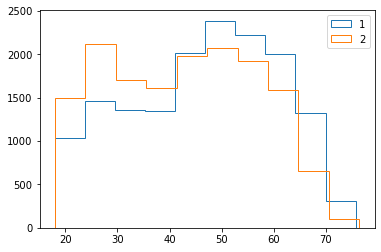

In [9]:
for sex, s_ in int_agesex.groupby("SEX"):
    plt.hist(s_["AGE"],histtype="step",label=sex)
plt.legend()

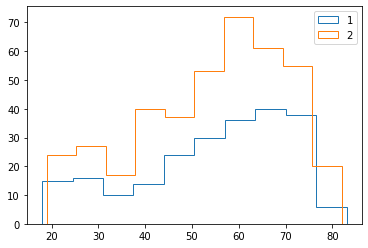

In [10]:
for sex, s_ in sys_agesex.groupby("SEX"):
    plt.hist(s_["AGE"],histtype="step",label=sex)
plt.legend()

In [11]:
# Reference set :
# -> Sex = 1
# -> Age between 40 and 60

In [12]:
#ref_IDs = agesex.loc[(agesex.SEX == 2) & (agesex.AGE >= 30) & (agesex.AGE <= 65)].index.tolist()

In [13]:
ref_IDs = agesex.loc[(agesex.SEX == 1) & (agesex.AGE >= 40) & (agesex.AGE <= 60)].index.tolist()

In [14]:
agesex.loc[agesex.index.isin(ref_IDs) & agesex.index.str.contains("C")].shape

(88, 2)

In [15]:
X_ref = X.loc[X.ID.isin(ref_IDs)]

# Compute breakpoints

For that, do PCA and features processing on all individuals in the reference set.

In [16]:
# fit PCA on all individuals in the reference frame

pca = PCA(n_components=2)
X_t = pd.DataFrame(index=X_ref.index)
X_t[["X_0","X_1"]] = pca.fit_transform(X_ref[FACS_COLS])
X_t["ID"] = X_ref["ID"]

In [17]:
# Compute features on X_t

def std_2nd_dim_high(df):
    Q_high = np.quantile(df.X_0,0.6)
    return df.loc[df.X_0 > Q_high,"X_1"].std()

def std_2nd_dim_low(df):
    Q_low = np.quantile(df.X_0,0.4)
    return df.loc[df.X_0 < Q_low,"X_1"].std()

g = X_t.groupby("ID")[["X_0","X_1"]]
#mean = g.mean()
median = g.median()
upper = g.quantile(0.9)
lower = g.quantile(0.1)
std = g.std()
iqr = g.quantile(0.75) - g.quantile(0.25)

print("Starting ratios")

ratio_upper = np.log10((upper["X_1"] - median["X_1"])/ (upper["X_0"] - median["X_1"]))
ratio_lower = np.log10((median["X_1"] - lower["X_1"]) / (median["X_0"] - lower["X_0"]))
ratio_std = np.log10(std["X_1"] / std["X_0"])

std_2_high = g.apply(std_2nd_dim_high)
std_2_low = g.apply(std_2nd_dim_low)

Starting ratios


In [18]:
std[["X_0","X_1"]] = np.log10(std[["X_0","X_1"]])
iqr[["X_0","X_1"]] = np.log10(iqr[["X_0","X_1"]])

In [19]:
features = pd.concat([
           median.rename(columns={"X_0":"median_0","X_1":"median_1"}),
           upper.rename(columns={"X_0":"upper_0","X_1":"upper_1"}),
           lower.rename(columns={"X_0":"lower_0","X_1":"lower_1"}),
           std.rename(columns={"X_0":"std_0","X_1":"std_1"}),
           iqr.rename(columns={"X_0":"iqr_0","X_1":"iqr_1"}),
           pd.DataFrame(ratio_upper).rename(columns={0:"ratio_upper"}),
           pd.DataFrame(ratio_lower).rename(columns={0:"ratio_lower"}),
           pd.DataFrame(ratio_std).rename(columns={0:"ratio_std"}),
           pd.DataFrame(np.log10(std_2_high)).rename(columns={0:"std_2_high"}),
           pd.DataFrame(np.log10(std_2_low)).rename(columns={0:"std_2_low"})],axis=1)
features = features.dropna(how="any",axis=0)

In [20]:
# Add machine and days since start

In [21]:
features = pd.merge(features, phen.set_index("SampleNo")[["days_since_start","machine"]],left_index=True,right_index=True,how="inner")
features = features.sort_values(["machine","days_since_start"])

(0, 600)

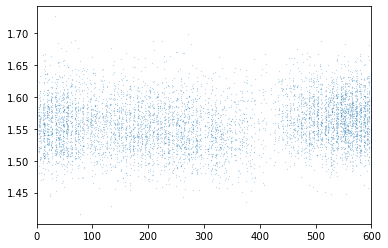

In [22]:
plt.scatter(features.days_since_start,features["std_0"],s=.01)
plt.xlim((0,600))

There
Here
0 breakpoints
There
Here
7 breakpoints
There
Here
10 breakpoints


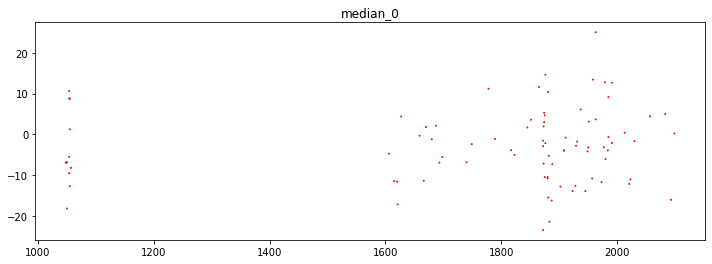

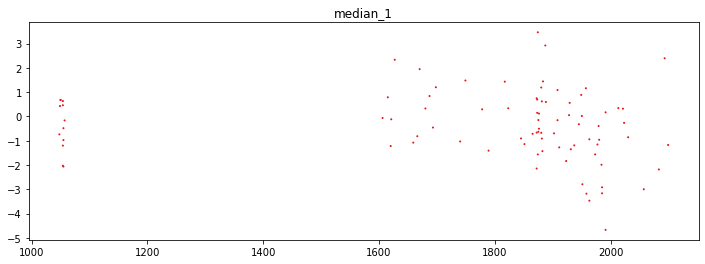

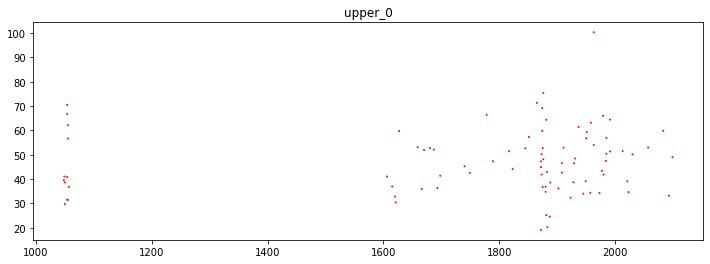

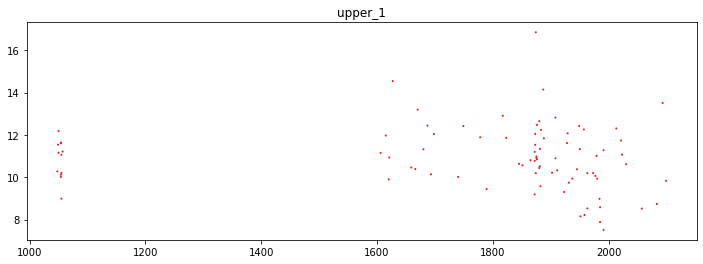

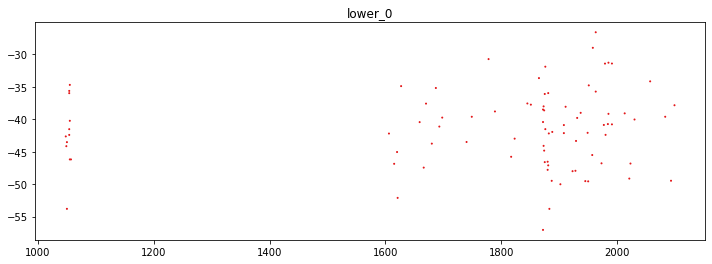

...

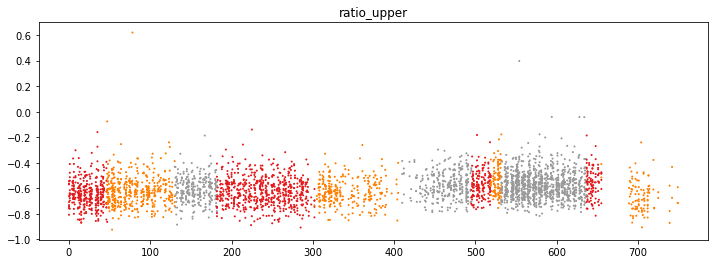

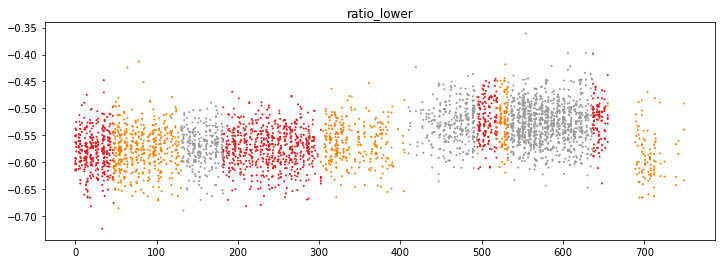

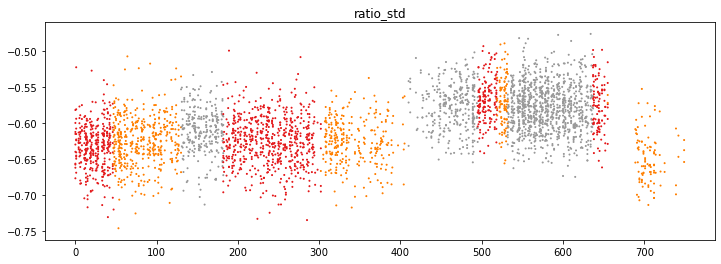

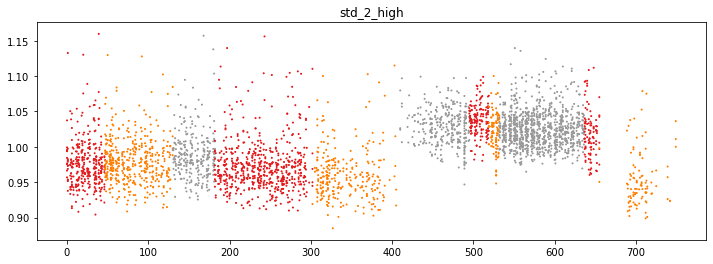

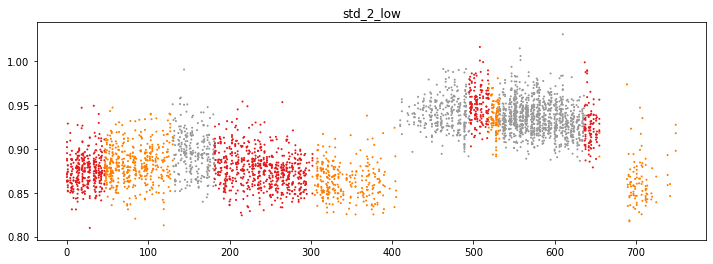

In [24]:
cohort_offset = 0
cohorts_dict = {}
for machine, F in features.groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    print("There")
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    print("Here")
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=1.6)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    for cohort, f in F.groupby("cohort"):
        assert cohort not in cohorts_dict
        cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [25]:
# Tag cohorts

cohorts_IDs = {}
tagged_IDs = []
for cohort in cohorts_dict:
    machine, m, M = cohorts_dict[cohort]
    cond = (phen.days_since_start >= m) & (phen.days_since_start <= M) & (phen.machine == machine)
    print(cohort,cond.sum())
    cohorts_IDs[cohort] = [ID for ID in phen.loc[cond].SampleNo.unique().tolist() if ID not in tagged_IDs]
    tagged_IDs += cohorts_IDs[cohort]

0 634
1 2699
2 3129
3 2116
4 537
5 5062
6 569
7 1588
8 397
9 1447
10 1902
11 1125
12 2616
13 1307
14 1289
15 682
16 430
17 3617
18 376
19 375


# Remove outliers in PFC cohort from ref_IDs

In [26]:
features["OK"] = True
ref_cond = features.index.isin(ref_IDs)
pfc_cond = features.index.str.contains("C")
pfc_ref_cond = ref_cond & pfc_cond
for f in features.columns[:-2]:
    max_deviation = 3*(features.loc[pfc_ref_cond,f].quantile(0.9) -\
                       features.loc[pfc_ref_cond,f].quantile(0.1))
    deviation = (features.loc[pfc_ref_cond,f] -\
                 features.loc[pfc_ref_cond,f].median()).abs()
    features.loc[pfc_ref_cond,"OK"] = features.loc[pfc_ref_cond,"OK"] & (deviation <= max_deviation)

print(len(ref_IDs))
wrong_PFC_IDs = features.loc[~features.OK & pfc_ref_cond].index.tolist()
ref_IDs = [ID for ID in ref_IDs if ID not in wrong_PFC_IDs]
print(len(ref_IDs))
del features["OK"]

7636
7636


# Adjust center and covariance matrix

In [27]:
def correlate(X):
    #/X[cols1].std(axis=0)
    center = X[FACS_COLS].mean(axis=0)
    C = (1./X.shape[0])*((X[FACS_COLS] - center).T) @ ((X[FACS_COLS] - center))
    return C

In [28]:
def adjust_cholesky(Q_ref,Q,center_ref,center,X,plot=False):
    L = cholesky(Q)
    L_ref = cholesky(Q_ref)
    X_decorr = X.copy()
    X_decorr[FACS_COLS] -= center
    X_decorr[FACS_COLS] = X_decorr[FACS_COLS] @ np.linalg.inv(L)

    X_recorr = X_decorr.copy()
    X_recorr[FACS_COLS] = X_recorr[FACS_COLS] @ L_ref
    X_recorr[FACS_COLS] += center_ref
    if plot:
        plt.figure()
        for f in FACS_COLS:
            plt.scatter(X[f],X_recorr[f],label=f)
        plt.legend()
    return X_recorr

In [29]:
ref_cond = X.ID.isin(ref_IDs)

## Compute reference center and Q on PFC cohort

In [30]:
pfc_ref_cond = ref_cond & X.ID.isin(cohorts_IDs[0])

In [31]:
center_pfc = X.loc[pfc_ref_cond,FACS_COLS].mean(axis=0)

In [32]:
center_pfc

FSC    71.033892
SSC    48.033633
SFL    80.932633
dtype: float64

In [33]:
Q_pfc = correlate(X.loc[pfc_ref_cond,FACS_COLS])

In [34]:
Q_pfc

,FSC,SSC,SFL
FSC,726.686877,292.828310,585.648164
SSC,292.828310,212.995729,255.647364
SFL,585.648164,255.647364,534.467652


## Test on one cohort

In [35]:
cohort_index = 13

In [36]:
def transform_cohort(cohort_index):
    cohort_cond = X.ID.isin(cohorts_IDs[cohort_index])
    cohort_ref_cond = ref_cond & cohort_cond
    
    Q_ref_cohort = correlate(X.loc[cohort_ref_cond,FACS_COLS])
    center_ref_cohort = X.loc[cohort_ref_cond,FACS_COLS].mean(axis=0)
    
    X_init = X.loc[cohort_cond].copy()
    X_transformed = X.loc[cohort_cond].copy()
    X_transformed[FACS_COLS] = adjust_cholesky(Q_pfc,Q_ref_cohort,center_pfc,center_ref_cohort,X_transformed[FACS_COLS],plot=False)
    return X_init, X_transformed

In [37]:
X_cohort_init, X_cohort_transformed = transform_cohort(3)

In [39]:
X_init_sample = X_cohort_init.sample(5000)
X_transformed_sample = X_cohort_transformed.sample(5000)
X_pfc_sample = X.loc[X.ID.isin(cohorts_IDs[0])].sample(5000)

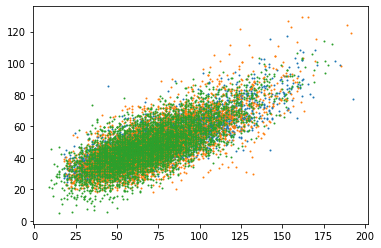

In [40]:
plt.scatter(X_init_sample.FSC,X_init_sample.SSC,s=1)
plt.scatter(X_transformed_sample.FSC,X_transformed_sample.SSC,s=1)
plt.scatter(X_pfc_sample.FSC,X_pfc_sample.SSC,s=1)

## Do that on all cohorts

In [41]:
adjusted_Xs = [X.loc[X.ID.isin(cohorts_IDs[0])]]
for cohort_ID in tqdm(cohorts_IDs):
    X_cohort_init, X_cohort_transformed = transform_cohort(cohort_ID)
    adjusted_Xs.append(X_cohort_transformed)

100%|██████████| 20/20 [02:29<00:00,  7.48s/it]


In [42]:
X_adj = pd.concat(adjusted_Xs,axis=0)

# Compute PCs of adjusted scattergrams

In [43]:
pfc_ref_IDs = X.loc[X.ID.str.contains("C") & X.ID.isin(ref_IDs)].ID.unique().tolist()

In [44]:
print("%d ref IDs in PFC cohort" % len(pfc_ref_IDs))

86 ref IDs in PFC cohort


In [45]:
# fit PCA on all adjusted scattergrams of individuals in the reference frame

pca = PCA(n_components=2)
X_adj_t = pd.DataFrame(index=X_adj.index)
pca.fit(X_adj.loc[X_adj.ID.isin(pfc_ref_IDs),FACS_COLS])
X_adj_t[["X_0","X_1"]] = pca.transform(X_adj[FACS_COLS])
X_adj_t["ID"] = X_adj["ID"]

In [46]:
g = X_adj_t.groupby("ID")[["X_0","X_1"]]
#mean = g.mean()
median = g.median()
upper = g.quantile(0.9)
lower = g.quantile(0.1)
std = g.std()
iqr = g.quantile(0.75) - g.quantile(0.25)

print("Starting ratios")

ratio_upper = np.log10((upper["X_1"] - median["X_1"])/ (upper["X_0"] - median["X_1"]))
ratio_lower = np.log10((median["X_1"] - lower["X_1"]) / (median["X_0"] - lower["X_0"]))
ratio_std = np.log10(std["X_1"] / std["X_0"])

std_2_high = g.apply(std_2nd_dim_high)
std_2_low = g.apply(std_2nd_dim_low)

Starting ratios


In [47]:
std[["X_0","X_1"]] = np.log10(std[["X_0","X_1"]])
iqr[["X_0","X_1"]] = np.log10(iqr[["X_0","X_1"]])

In [48]:
features = pd.concat([
           median.rename(columns={"X_0":"median_0","X_1":"median_1"}),
           upper.rename(columns={"X_0":"upper_0","X_1":"upper_1"}),
           lower.rename(columns={"X_0":"lower_0","X_1":"lower_1"}),
           std.rename(columns={"X_0":"std_0","X_1":"std_1"}),
           iqr.rename(columns={"X_0":"iqr_0","X_1":"iqr_1"}),
           pd.DataFrame(ratio_upper).rename(columns={0:"ratio_upper"}),
           pd.DataFrame(ratio_lower).rename(columns={0:"ratio_lower"}),
           pd.DataFrame(ratio_std).rename(columns={0:"ratio_std"}),
           pd.DataFrame(np.log10(std_2_high)).rename(columns={0:"std_2_high"}),
           pd.DataFrame(np.log10(std_2_low)).rename(columns={0:"std_2_low"})],axis=1)
features = features.dropna(how="any",axis=0)

In [49]:
features = pd.merge(features, phen.set_index("SampleNo")[["days_since_start","machine"]],left_index=True,right_index=True,how="inner")
features = features.sort_values(["machine","days_since_start"])

0 breakpoints
13 breakpoints
7 breakpoints


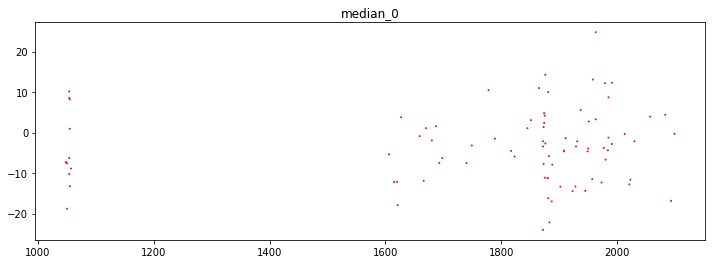

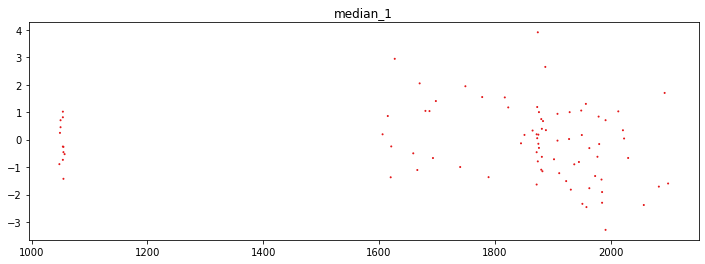

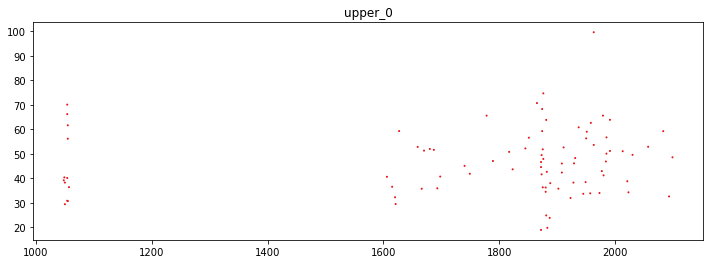

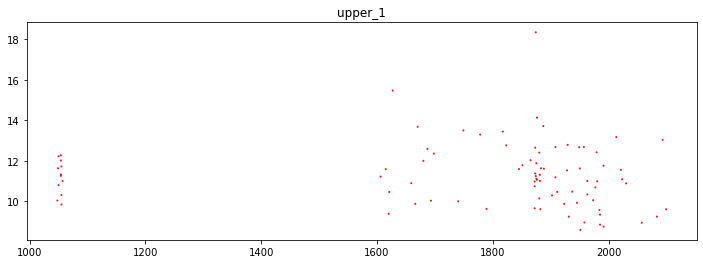

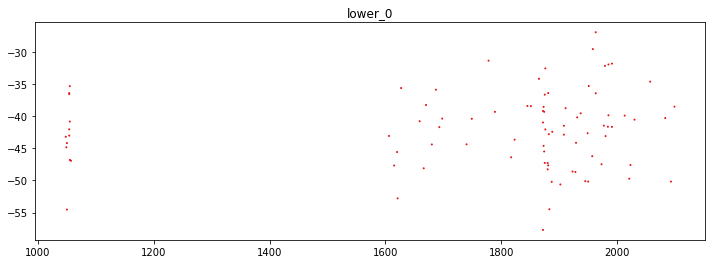

...

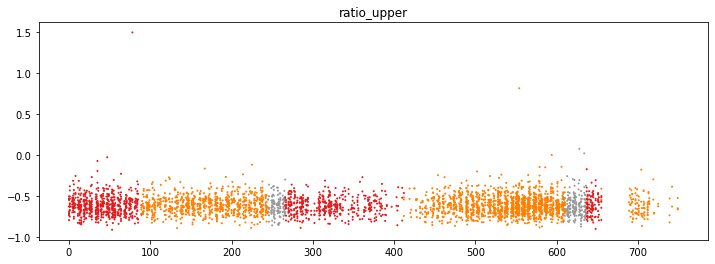

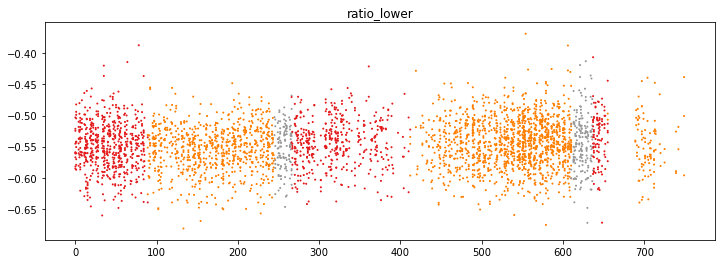

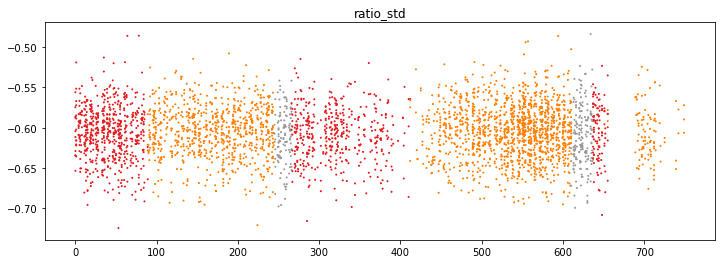

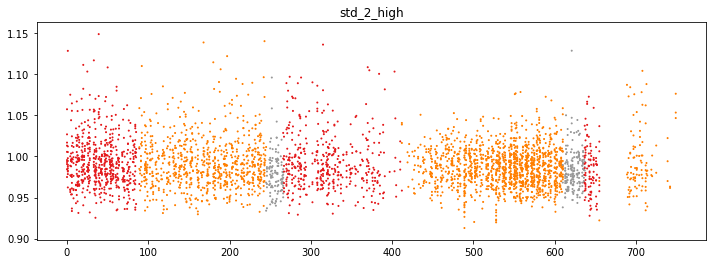

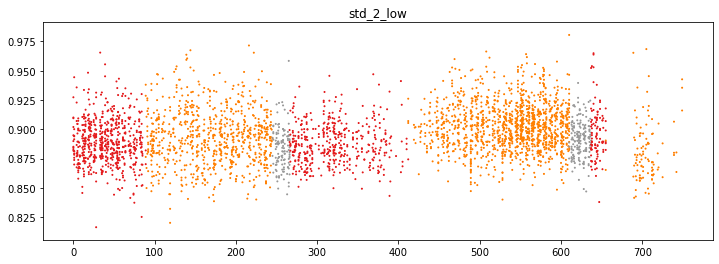

In [50]:
cohort_offset = 0
cohorts_dict = {}
for machine, F in features.loc[features.index.isin(ref_IDs)].groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=1.6)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    for cohort, f in F.groupby("cohort"):
        assert cohort not in cohorts_dict
        cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [51]:
# Tag cohorts

cohorts_IDs = {}
tagged_IDs = []
for cohort in cohorts_dict:
    machine, m, M = cohorts_dict[cohort]
    cond = (phen.days_since_start >= m) & (phen.days_since_start <= M) & (phen.machine == machine)
    print(cohort,cond.sum())
    cohorts_IDs[cohort] = [ID for ID in phen.loc[cond].SampleNo.unique().tolist() if ID not in tagged_IDs]
    tagged_IDs += cohorts_IDs[cohort]

0 634
1 1834
2 1424
3 488
4 846
5 497
6 732
7 769
8 439
9 535
10 1103
11 1265
12 480
13 3920
14 1931
15 2509
16 3327
17 530
18 2001
19 5136
20 792
21 376
22 375


In [52]:
adjusted_features = features.copy()

In [53]:
# Remove outliers
ref_cond = adjusted_features.index.isin(ref_IDs)
adjusted_features["OK"] = True
for cohort in cohorts_dict:
    cohort_cond = adjusted_features.index.isin(cohorts_IDs[cohort])
    cohort_ref_cond = cohort_cond & ref_cond
    print(cohort_ref_cond.sum())
    for f in adjusted_features.columns[:-2]: # 2 last columns aren't features
        max_deviation = 3*(adjusted_features.loc[cohort_cond,f].quantile(0.9) -\
                           adjusted_features.loc[cohort_cond,f].quantile(0.1))
        deviation = (adjusted_features.loc[cohort_cond,f] -\
                     adjusted_features.loc[cohort_cond,f].median()).abs()
        adjusted_features.loc[cohort_cond,"OK"] = adjusted_features.loc[cohort_cond,"OK"] & (deviation <= max_deviation)

86
452
320
100
195
113
150
154
101
120
219
264
120
1042
537
602
775
121
435
1353
183
93
98


In [54]:
adjusted_features.shape

(31354, 18)

In [55]:
adjusted_features.OK.sum()

31320

In [56]:
adjusted_features = adjusted_features.loc[adjusted_features.OK]

In [57]:
del adjusted_features["OK"]

In [58]:
# Adjust features by median value in cohort (computed only on ref individuals)

In [59]:
adjusted_features.columns

Index(['median_0', 'median_1', 'upper_0', 'upper_1', 'lower_0', 'lower_1',
       'std_0', 'std_1', 'iqr_0', 'iqr_1', 'ratio_upper', 'ratio_lower',
       'ratio_std', 'std_2_high', 'std_2_low', 'days_since_start', 'machine'],
      dtype='object')

In [60]:
ref_cond = adjusted_features.index.isin(ref_IDs)

In [61]:
for cohort in cohorts_IDs:
    cohort_cond = adjusted_features.index.isin(cohorts_IDs[cohort])
    cohort_ref_cond = cohort_cond & ref_cond
    for f in adjusted_features.columns[:-2]: # 2 last columns aren't features
        #print(adjusted_features.loc[cohort_ref_cond,f].std())
        adjusted_features.loc[cohort_cond,f] -= adjusted_features.loc[cohort_ref_cond,f].median()
        adjusted_features.loc[cohort_cond,f] /= adjusted_features.loc[cohort_ref_cond,f].std()

In [62]:
# Visualize on ref people

In [63]:
adjusted_features.columns

Index(['median_0', 'median_1', 'upper_0', 'upper_1', 'lower_0', 'lower_1',
       'std_0', 'std_1', 'iqr_0', 'iqr_1', 'ratio_upper', 'ratio_lower',
       'ratio_std', 'std_2_high', 'std_2_low', 'days_since_start', 'machine'],
      dtype='object')

0 breakpoints
1 breakpoints
0 breakpoints


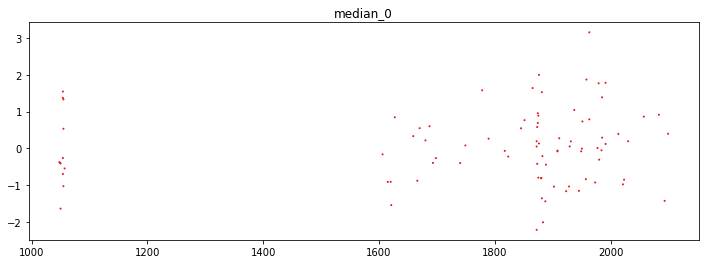

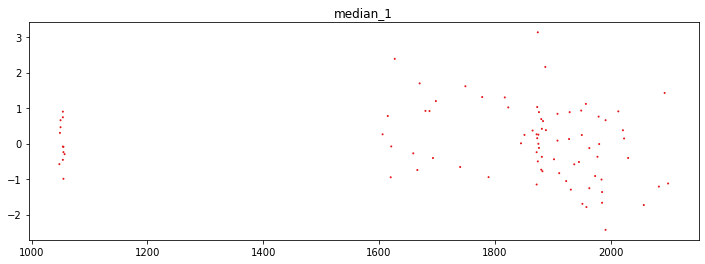

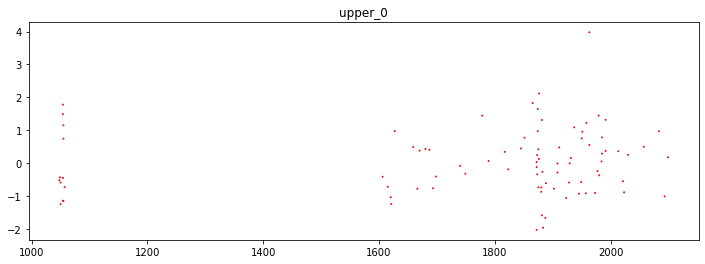

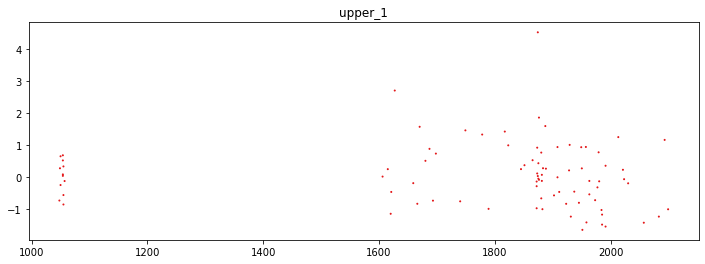

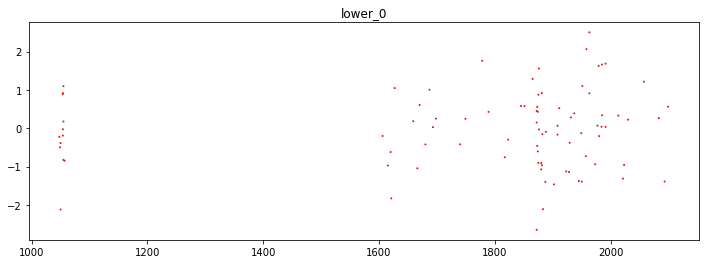

...

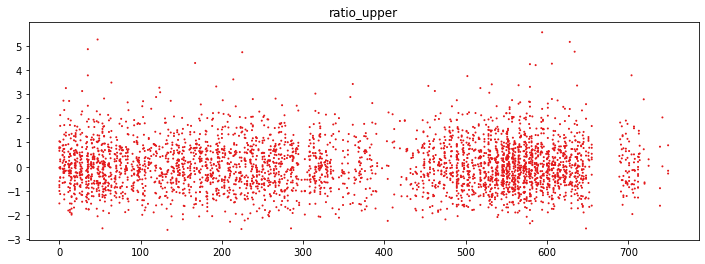

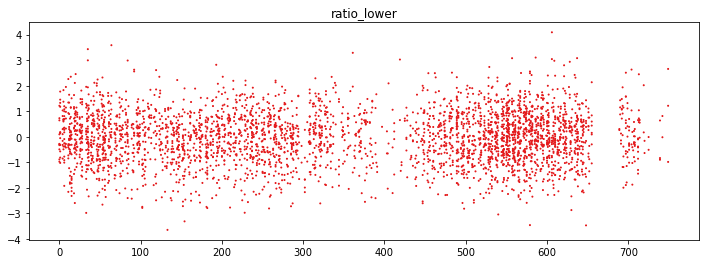

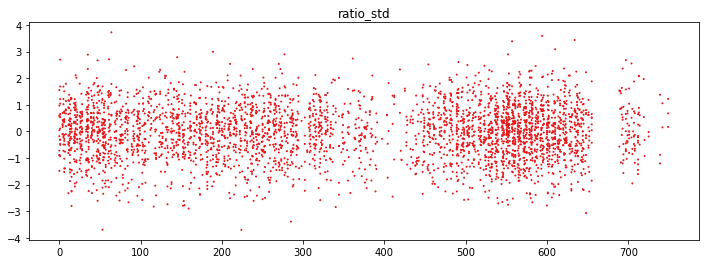

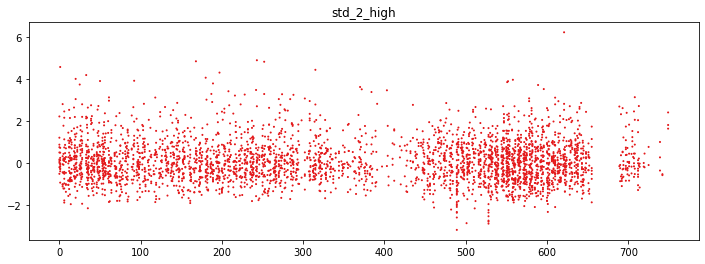

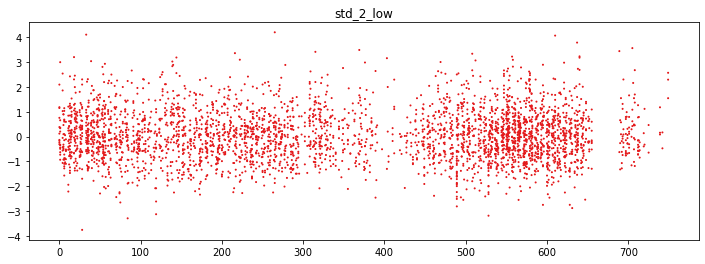

In [64]:
cohort_offset = 0
#cohorts_dict = {}
for machine, F in adjusted_features.loc[adjusted_features.index.isin(ref_IDs)].groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=1.6)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    #for cohort, f in F.groupby("cohort"):
    #    assert cohort not in cohorts_dict
    #    cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [65]:
# Visualize on all

1 breakpoints
24 breakpoints
15 breakpoints


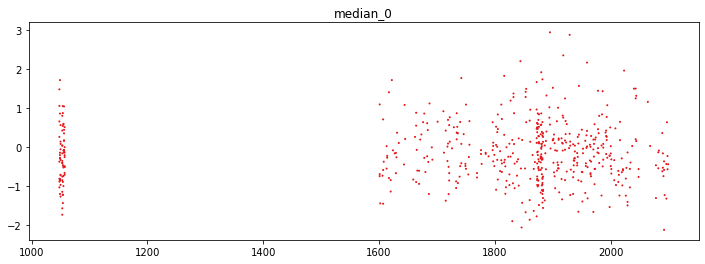

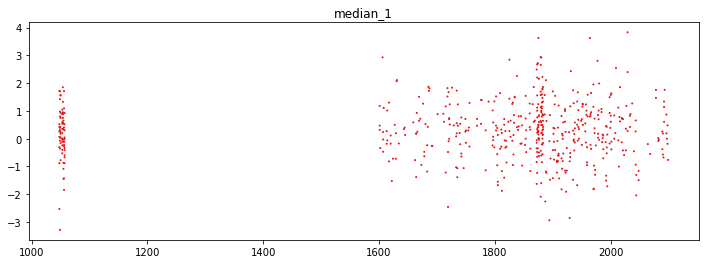

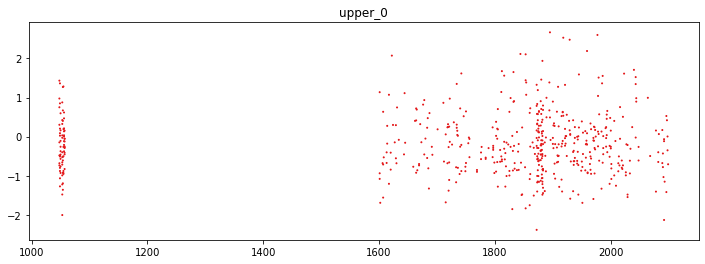

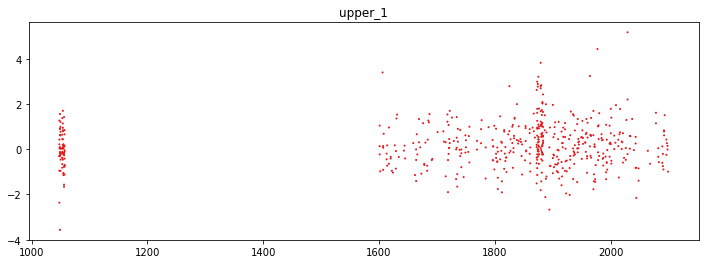

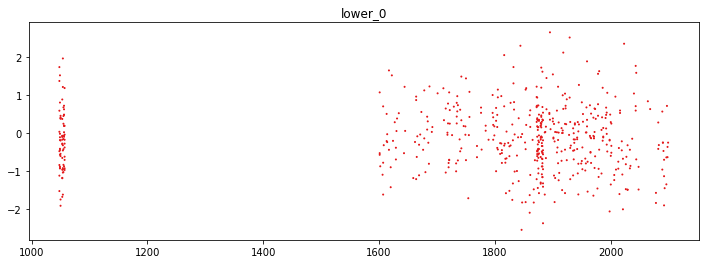

...

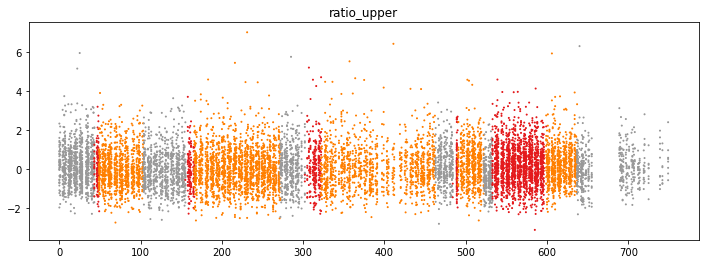

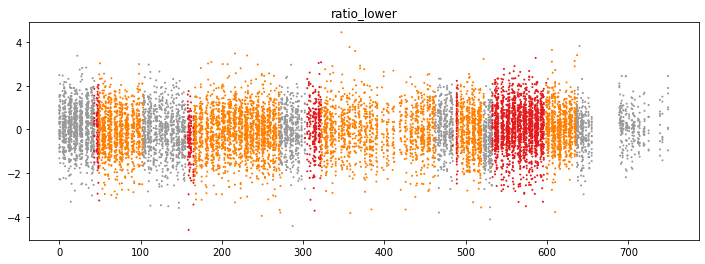

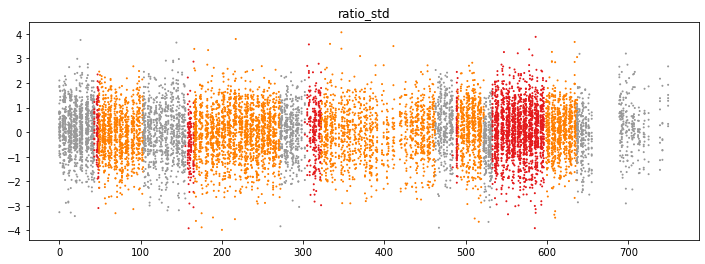

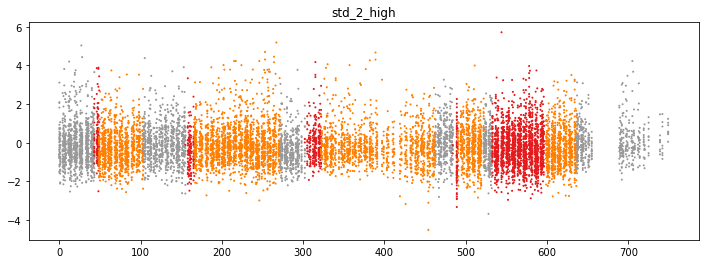

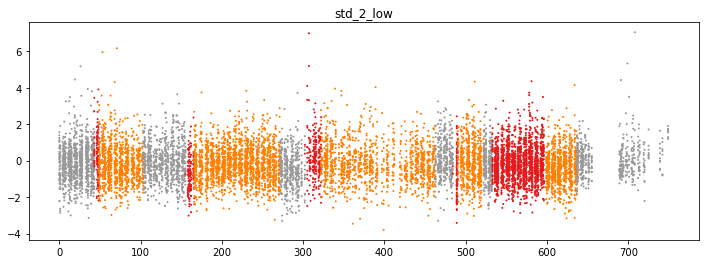

In [66]:
cohort_offset = 0
#cohorts_dict = {}
for machine, F in adjusted_features.loc[~adjusted_features.index.isin(ref_IDs)].groupby("machine"):
    F = F.sort_values("days_since_start")
    F_ = F[F.columns[:-2]]
    F_ -= np.mean(F_,axis=0)
    F_ /= np.std(F_,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=min(100,F.shape[0]//2)).fit(
        F_.values
    )
    
    F["rank"] = np.arange(F.shape[0])
    bkps = algo_c.predict(pen=2.5)
    bkps = [0] + bkps
    print("%d breakpoints" % (len(bkps)-2))
    F["cohort"] = cohort_offset
    if machine > 0: # We force all PFC samples to be in the same cohort
        # because we want to use tht as a reference cohort
        for b in bkps[1:]:
            F.loc[F["rank"] >= b,"cohort"] += 1
    cohort_offset = F.cohort.max() + 1
    #for cohort, f in F.groupby("cohort"):
    #    assert cohort not in cohorts_dict
    #    cohorts_dict[cohort] = (machine,f.days_since_start.min(),f.days_since_start.max())
    for i in range(F.shape[1]-4):
        plt.figure(figsize=(12,4))
        plt.scatter(F["days_since_start"],F[F.columns[i]],c=F["cohort"] % 3,s=1,cmap="Set1")
        plt.title(F.columns[i])

In [67]:
# Export features

In [68]:
data_dir = "/home/hv270/rds/rds-who1000-cbrc/user/wja24/shared/hv270/data_home"

In [69]:
adjusted_features.to_csv("%s/processed/adjusted_features.csv" % data_dir)

In [70]:
raise "Error"

TypeError: exceptions must derive from BaseException

In [ ]:
sys_cohort = ~PLT.ID.str.contains("INT_116")

In [ ]:
plt_sys = PLT.loc[sys_cohort].sample(3000)
plt_int = PLT.loc[~sys_cohort].sample(3000)

In [ ]:
plt.scatter(plt_sys["FSC"],plt_sys["SSC"],c="blue",s=1)
plt.scatter(plt_int["FSC"],plt_int["SSC"],c="red",s=1)

In [ ]:
i = 0
for ID, sys in PLT.loc[sys_cohort].groupby("ID"):
    #plt.figure()
    plt.scatter(sys.SFL, sys.FSC, s= 1)
    i += 1
    if i > 5:
        break

In [ ]:
plt.scatter(plt_sys["SSC"],plt_sys["SFL"],c="blue",s=1)
plt.scatter(plt_int["SSC"],plt_int["SFL"],c="red",s=1)

In [ ]:
plt.scatter(plt_sys["FSC"],plt_sys["SFL"],c="blue",s=1)
plt.scatter(plt_int["FSC"],plt_int["SFL"],c="red",s=1)

In [ ]:
for c in FACS_COLS:
    plt.figure()
    plt.hist(PLT.loc[sys_cohort,c],histtype="step",density=True,bins=50,color="blue")
    plt.hist(PLT.loc[~sys_cohort,c],histtype="step",density=True,bins=50,color="red")
    plt.xlabel(c)

In [ ]:
#X = X.loc[sys_cohort]

# Plan
- Apply PCA on individuals
- compute features for the first time
- detect cohorts
- apply PCA per cohort
- compute final features

# Apply PCA and build features

In [ ]:
def apply_individual_pca(args):
    ID, df = args
    pca = PCA(n_components=2).fit(df[FACS_COLS])
    pca.components_[0,:] /= np.sign(pca.components_[0,1])
    pca.components_[1,:] /= np.sign(pca.components_[1,1])
    df[["X_0","X_1"]] = pca.transform(df[FACS_COLS])
    df["ID"] = ID
    w = np.reshape(pca.components_,(-1,))
    return df, pd.Series(w), ID

In [ ]:
g = X.groupby("ID")
X_IDs = X.ID.unique().tolist()

p = Pool(15)
Xs = []
pc_comps = {}
for result in tqdm(p.imap_unordered(apply_individual_pca, g), total = len(X_IDs)):
    X_, w, ID = result
    Xs.append(X_)
    pc_comps[ID] = w
p.close()
p.join()

In [ ]:
X = pd.concat(Xs,axis=0)

In [ ]:
pca_coefs = pd.DataFrame.from_dict(pc_comps,orient="index").add_prefix("PC_")

In [ ]:
sys_cohort = ~X.ID.str.contains("INT_116")

In [ ]:
X_sys = X.loc[sys_cohort,["X_0","X_1"]].sample(3000)
X_int = X.loc[~sys_cohort,["X_0","X_1"]].sample(3000)
plt.scatter(X_sys["X_0"],X_sys["X_1"],c="blue",s=1)
plt.scatter(X_int["X_0"],X_int["X_1"],c="red",s=1)

In [ ]:
def std_2nd_dim_high(df):
    Q_high = np.quantile(df.X_0,0.6)
    return df.loc[df.X_0 > Q_high,"X_1"].std()

def std_2nd_dim_low(df):
    Q_low = np.quantile(df.X_0,0.4)
    return df.loc[df.X_0 < Q_low,"X_1"].std()

In [ ]:
g = X.groupby("ID")[["X_0","X_1"]]
mean = g.mean()
median = g.median()
upper = g.quantile(0.9)
lower = g.quantile(0.1)
std = g.std()
iqr = g.quantile(0.75) - g.quantile(0.25)


ratio_upper = np.log10((upper["X_1"] - median["X_1"])/ (upper["X_0"] - median["X_1"]))
ratio_lower = np.log10((median["X_1"] - lower["X_1"]) / (median["X_0"] - lower["X_0"]))
ratio_std = np.log10(std["X_1"] / std["X_0"])

std_2_high = g.apply(std_2nd_dim_high)
std_2_low = g.apply(std_2nd_dim_low)

In [ ]:
features = pd.concat([#mean.rename(columns={"X_0":"mean_0","X_1":"mean_1"}),
           median.rename(columns={"X_0":"median_0","X_1":"median_1"}),
           upper.rename(columns={"X_0":"upper_0","X_1":"upper_1"}),
           lower.rename(columns={"X_0":"lower_0","X_1":"lower_1"}),
           std.rename(columns={"X_0":"std_0","X_1":"std_1"}),
           iqr.rename(columns={"X_0":"iqr_0","X_1":"iqr_1"}),
           pd.DataFrame(ratio_upper).rename(columns={0:"ratio_upper"}),
           pd.DataFrame(ratio_lower).rename(columns={0:"ratio_lower"}),
           pd.DataFrame(ratio_std).rename(columns={0:"ratio_std"}),
           pd.DataFrame(std_2_high).rename(columns={0:"std_2_high"}),
           pd.DataFrame(std_2_low).rename(columns={0:"std_2_low"})],axis=1)
features = features.dropna(how="any",axis=0)

In [ ]:
features = pd.merge(features, pca_coefs,left_index=True,right_index=True)

In [ ]:
features

In [ ]:
for c in features.columns:
    plt.figure()
    plt.hist(features.loc[features.index.str.contains("INT_116"),c],density=True,bins=20,histtype="step")
    plt.hist(features.loc[~features.index.str.contains("INT_116"),c],density=True,bins=20,histtype="step")
    plt.title(c)

# Time-cohort-machine adjust

## Sysmex cohort (PFC cohort)

In [ ]:
sys_values = features.loc[~features.index.str.contains("INT_116")]

In [ ]:
sys_phen = load_sys_phenotypes(data_dir)
sys_phen["time_col"] = pd.to_datetime(sys_phen["Date"],format="%d/%m/%Y")
sys_phen.sort_values("time_col",inplace=True)

In [ ]:
sys_info = pd.merge(sys_values,sys_phen.set_index("ID")[["time_col"]],left_index=True,right_index=True).sort_values("time_col")

In [ ]:
sys_info.head()

In [ ]:
X = sys_info[features.columns].values
X -= np.mean(X,axis=0)
X /= np.std(X,axis=0)

In [ ]:
algo_c = rp.KernelCPD(kernel="rbf", min_size=80).fit(
    X
)

In [ ]:
bkps = algo_c.predict(pen=2)
bkps = [0] + bkps
print("%d BKPS" % len(bkps))

sys_info["cohort"] = 0
sys_info["rank"] = np.arange(sys_info.shape[0])
for b in bkps[1:]:
    sys_info.loc[sys_info["rank"] >= b,"cohort"] += 1
    
plt.figure(figsize=(10,4))
for i in range(X.shape[1]):
    plt.figure(figsize=(10,2))
    plt.scatter(sys_info["time_col"],X[:,i],s=3,c=sys_info.cohort)
    for b in bkps[:-1]:
        plt.axvline(sys_info["time_col"].iloc[b],c="pink")

## Interval cohort

In [ ]:
int_phen, meta = get_INTERVAL_phenotypes()

In [ ]:
int_values = features.loc[features.index.str.contains("INT_116")]

In [ ]:
cohort_offset = sys_info.cohort.max() + 1
machines = int_phen["Instrument"].unique().tolist()
int_infos = []
for instrument in machines:
    int_info = pd.merge(int_values, int_phen.loc[int_phen.Instrument == instrument,
                                                      ["SampleNo","DateTime"]],
                        left_index=True,right_on="SampleNo",how="inner")
    
    int_info.sort_values("DateTime",inplace=True)
    X = int_info[features.columns].values
    X -= np.mean(X,axis=0)
    X /= np.std(X,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=300).fit(
        X
    )
    
    bkps = algo_c.predict(pen=2.)
    bkps = [0] + bkps
    print("%d BKPS" % len(bkps))

    int_info["cohort"] = cohort_offset
    int_info["rank"] = np.arange(int_info.shape[0])
    for b in bkps[1:]:
        int_info.loc[int_info["rank"] >= b,"cohort"] += 1

    plt.figure(figsize=(10,4))
    for i in range(X.shape[1]):
        plt.figure(figsize=(10,2))
        plt.scatter(int_info["rank"],X[:,i],s=.3,c=int_info.cohort)
        for b in bkps[:-1]:
            plt.axvline(int_info["rank"].iloc[b],c="pink")
        plt.title(features.columns[i])
    int_infos.append(int_info)
    cohort_offset = int_info.cohort.max() + 1
int_info = pd.concat(int_infos,axis=0)

In [ ]:
int_info.head()

In [ ]:
sys_info.head()

In [ ]:
PLT_cohort = pd.merge(PLT,int_info[["SampleNo","cohort"]],left_on="ID",right_on="SampleNo",how="left")
del PLT_cohort["SampleNo"]
PLT_cohort.loc[PLT_cohort.cohort.isnull(),"cohort"] = -1
PLT_cohort.cohort = PLT_cohort.cohort.astype(int)

In [ ]:
PLT_cohort.sample(3)

In [ ]:
def apply_cohort_pca(args):
    cohort, df = args
    df[FACS_COLS] -= df[FACS_COLS].mean(axis=0)
    df[FACS_COLS] /= df[FACS_COLS].std(axis=0)
    pca = PCA(n_components=2).fit(df[FACS_COLS])
    pca.components_[0,:] /= np.sign(pca.components_[0,1])
    pca.components_[1,:] /= np.sign(pca.components_[1,1])
    df[["X_0","X_1"]] = pca.transform(df[FACS_COLS])
    #df["cohort"] = ID
    #w = np.reshape(pca.components_,(-1,))
    return df#, pd.Series(w), ID

In [ ]:
g = PLT_cohort.groupby("cohort")
cohorts = PLT_cohort.cohort.unique().tolist()

p = Pool(15)
cohorts_dfs = []
for result in tqdm(p.imap_unordered(apply_cohort_pca, g), total = len(cohorts)):
    X_ = result
    cohorts_dfs.append(X_)
p.close()
p.join()

In [ ]:
adj_PLT_cohorts = pd.concat(cohorts_dfs,axis=0)

In [ ]:
adj_PLT_cohorts.sample(3)

In [ ]:
i = 0
for cohort, df in adj_PLT_cohorts.groupby("cohort"):
    #plt.figure()
    df_ = df.sample(1000)
    plt.scatter(df_.X_0, df_.X_1, s= 1)
    i += 1
    if i > 5:
        break

In [ ]:
g = adj_PLT_cohorts.groupby("ID")[["X_0","X_1"]]
mean = g.mean()
median = g.median()
upper = g.quantile(0.9)
lower = g.quantile(0.1)
#upper_ext = g.quantile(0.975)
#lower_ext = g.quantile(0.025)
std = g.std()
iqr = g.quantile(0.75) - g.quantile(0.25)
#skew = g.skew()


ratio_upper = np.log10((upper["X_1"] - median["X_1"])/ (upper["X_0"] - median["X_1"]))
ratio_lower = np.log10((median["X_1"] - lower["X_1"]) / (median["X_0"] - lower["X_0"]))
ratio_std = np.log10(std["X_1"] / std["X_0"])

std_2_high = g.apply(std_2nd_dim_high)
std_2_low = g.apply(std_2nd_dim_low)

In [ ]:
features = pd.concat([#mean.rename(columns={"X_0":"mean_0","X_1":"mean_1"}),
           median.rename(columns={"X_0":"median_0","X_1":"median_1"}),
           upper.rename(columns={"X_0":"upper_0","X_1":"upper_1"}),
           lower.rename(columns={"X_0":"lower_0","X_1":"lower_1"}),
           #upper_ext.rename(columns={"X_0":"upper_ext_0","X_1":"upper_ext_1"}),
           #lower_ext.rename(columns={"X_0":"lower_ext_0","X_1":"lower_ext_1"}),
           std.rename(columns={"X_0":"std_0","X_1":"std_1"}),
           iqr.rename(columns={"X_0":"iqr_0","X_1":"iqr_1"}),
           pd.DataFrame(ratio_upper).rename(columns={0:"ratio_upper"}),
           pd.DataFrame(ratio_lower).rename(columns={0:"ratio_lower"}),
           pd.DataFrame(ratio_std).rename(columns={0:"ratio_std"}),
           pd.DataFrame(std_2_high).rename(columns={0:"std_2_high"}),
           pd.DataFrame(std_2_low).rename(columns={0:"std_2_low"})],axis=1)
features = features.dropna(how="any",axis=0)

In [ ]:
features.sample(5)

In [ ]:
int_values = features.loc[features.index.str.contains("INT_116")]

In [ ]:
cohort_offset = sys_info.cohort.max() + 1
machines = int_phen["Instrument"].unique().tolist()
int_infos = []
for instrument in machines:
    int_info = pd.merge(int_values, int_phen.loc[int_phen.Instrument == instrument,
                                                      ["SampleNo","DateTime"]],
                        left_index=True,right_on="SampleNo",how="inner")
    
    int_info.sort_values("DateTime",inplace=True)
    X = int_info[features.columns].values
    X -= np.mean(X,axis=0)
    X /= np.std(X,axis=0)
    
    algo_c = rp.KernelCPD(kernel="rbf", min_size=300).fit(
        X
    )
    
    bkps = algo_c.predict(pen=2.)
    bkps = [0] + bkps
    print("%d BKPS" % len(bkps))

    int_info["cohort"] = cohort_offset
    int_info["rank"] = np.arange(int_info.shape[0])
    for b in bkps[1:]:
        int_info.loc[int_info["rank"] >= b,"cohort"] += 1

    plt.figure(figsize=(10,4))
    for i in range(X.shape[1]):
        plt.figure(figsize=(10,2))
        plt.scatter(int_info["rank"],X[:,i],s=.3,c=int_info.cohort)
        for b in bkps[:-1]:
            plt.axvline(int_info["rank"].iloc[b],c="pink")
        plt.title(features.columns[i])
    int_infos.append(int_info)
    cohort_offset = int_info.cohort.max() + 1
int_info = pd.concat(int_infos,axis=0)

In [ ]:
for c in features.columns:
    plt.figure()
    plt.hist(features.loc[features.index.str.contains("INT_116"),c],density=True,bins=20,histtype="step")
    plt.hist(features.loc[~features.index.str.contains("INT_116"),c],density=True,bins=20,histtype="step")
    plt.title(c)

In [ ]:
plt.scatter(np.arange(features.shape[0]),features.median_0,s=.01)

## Clip outliers

In [ ]:
for c in features.columns:
    median = np.median(features[c])
    std = np.std(features[c])
    m = median - 4*std
    M = median + 4*std
    outliers = (features[c] - median).abs() > 4*std
    print("%s : %d outliers" % (c, outliers.sum()))
    features[c] = np.clip(features[c],m,M)

# Export

In [ ]:
features.to_hdf("%s/processed/features.hdf" % datadir, key="features")

In [ ]:
cohorts = pd.merge(features,int_info[["cohort","SampleNo"]],left_index=True,right_on="SampleNo",how="left")[["SampleNo","cohort"]]
cohorts.loc[cohorts.cohort.isnull(),"cohort"] = -1
cohorts["cohort"] = cohorts["cohort"].astype(int)

In [ ]:
cohorts.to_hdf("%s/processed/cohorts.hdf" % datadir,key="cohorts")